# Генеративно-Состязательная Сеть (GAN)

In [3]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_datasets as tfds

## Загрузка и подготовка датасета LFW

In [29]:
train_ds = tfds.load('lfw', split='train', as_supervised=False)

In [30]:
def prepare(item):
  image = item['image']
  image = (tf.cast(image, tf.float32) - 127.5) / 127.5
  image = tf.image.resize(image,[56,56])
  return image


train_ds = train_ds.map(prepare)
train_ds

<MapDataset shapes: (56, 56, 3), types: tf.float32>

## Визуализация датасета

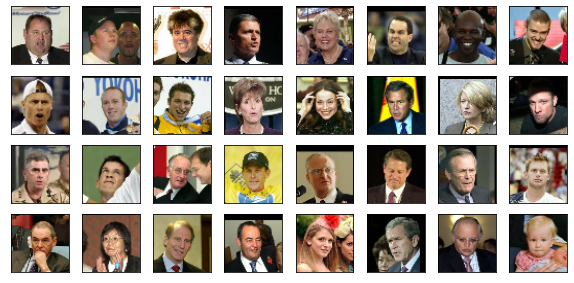

In [31]:
def plot_lfw(samples):
    fig = plt.figure(figsize=(10, 10))
    num = len(samples)
    for j, sample in enumerate(samples):
        ax = fig.add_subplot(8, 8, j+1)
        ax.imshow((sample+1)/2)
        plt.xticks([]), plt.yticks([])
    plt.show()
    
plot_lfw(train_ds.take(32))

## Deep Convolutional GAN (DCGAN)

In [32]:
generator = tf.keras.Sequential([
    tf.keras.layers.Dense(256*7*7, activation='relu'),
    tf.keras.layers.Reshape((7, 7, 256)),
    
    tf.keras.layers.UpSampling2D((2, 2)),   
    
    tf.keras.layers.Conv2D(256, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),    
    
    tf.keras.layers.UpSampling2D((2, 2)),   
    
    tf.keras.layers.Conv2D(128, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),    
    
    tf.keras.layers.UpSampling2D((2, 2)),   
    
    tf.keras.layers.Conv2D(64, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),    
    
    tf.keras.layers.Conv2D(3, (3, 3), padding='same', activation='tanh'),
])

discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same'),
    tf.keras.layers.LeakyReLU(0.2),
    tf.keras.layers.Dropout(0.25),    
    
    tf.keras.layers.Conv2D(64, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    
    tf.keras.layers.Conv2D(128, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    
    tf.keras.layers.Conv2D(256, kernel_size=3, strides=(1, 1), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1),
])

In [33]:
INPUT_DIM = 300
NUM_EPOCHS = 20
HALF_BATCH_SIZE = 32
BATCH_SIZE = HALF_BATCH_SIZE * 2
LEARNING_RATE = 0.0002

train_ds = train_ds.shuffle(len(train_ds))
train_ds = train_ds.repeat(NUM_EPOCHS)
train_ds = train_ds.batch(HALF_BATCH_SIZE, drop_remainder=True)

optimizer = tf.keras.optimizers.Adam(LEARNING_RATE)
sigmoid_cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [34]:
def plot_syntetic(samples):
    fig = plt.figure(figsize=(10, 10))
    num = samples.shape[0]
    for j in range(num):
        ax = fig.add_subplot(4, 4, j+1)
        ax.imshow((samples[j, ...].reshape(56, 56, 3)+1)/2)
        plt.xticks([]), plt.yticks([])
    plt.show()

[Step  0] D Loss: 0.6589; G Loss: 0.6881


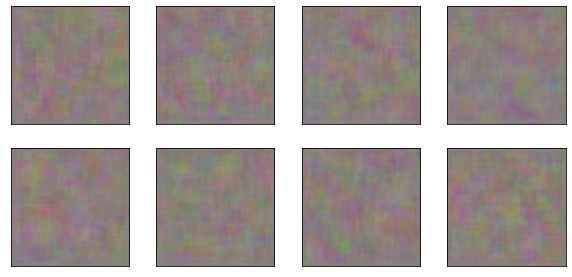

[Step 100] D Loss: 0.1384; G Loss: 5.2247


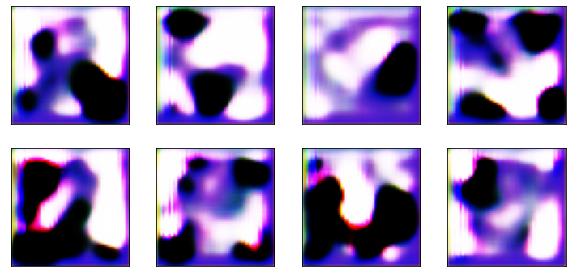

[Step 200] D Loss: 0.5162; G Loss: 0.7309


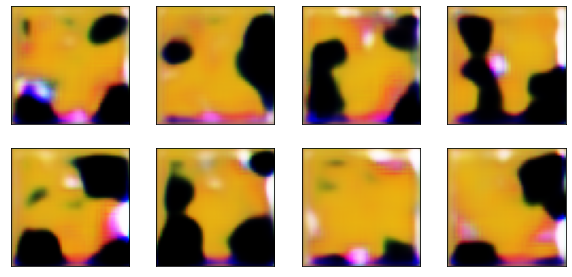

[Step 300] D Loss: 0.3066; G Loss: 3.1011


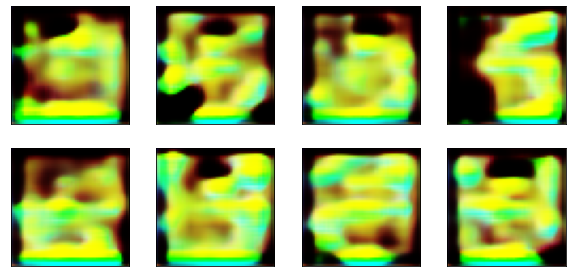

[Step 400] D Loss: 0.1460; G Loss: 0.8704


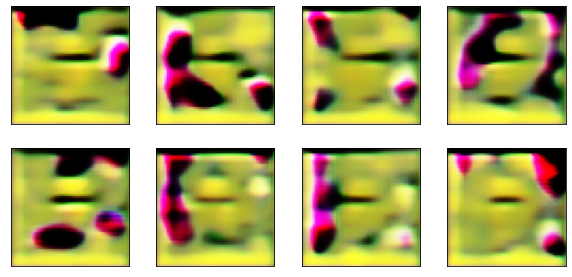

[Step 500] D Loss: 0.0944; G Loss: 3.0635


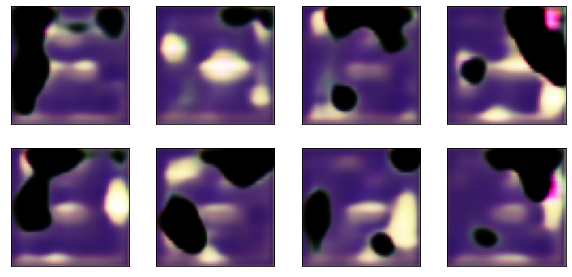

[Step 600] D Loss: 0.1587; G Loss: 3.6026


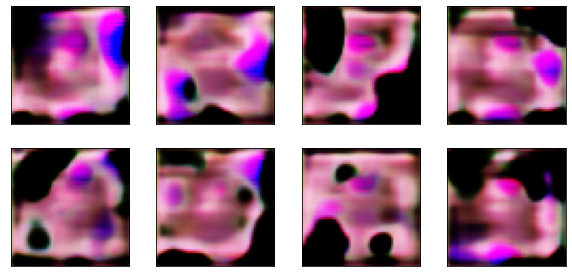

[Step 700] D Loss: 0.3422; G Loss: 1.3696


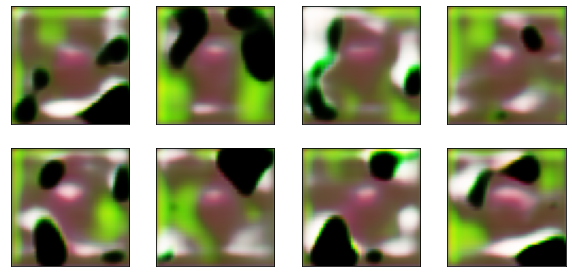

[Step 800] D Loss: 0.3340; G Loss: 3.9900


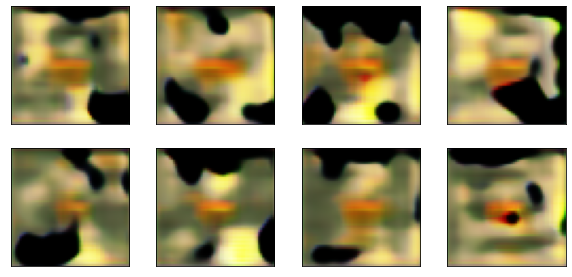

[Step 900] D Loss: 0.5160; G Loss: 3.5338


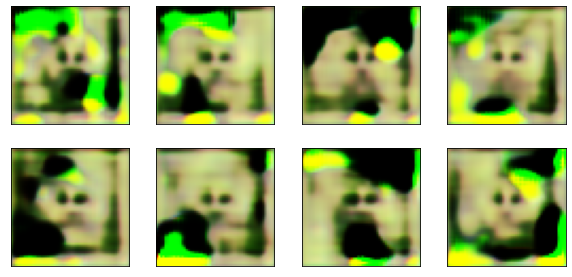

[Step 1000] D Loss: 0.1081; G Loss: 8.4380


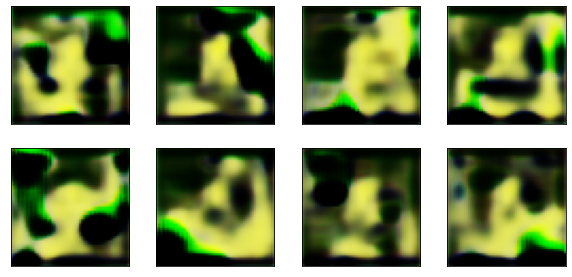

[Step 1100] D Loss: 0.3416; G Loss: 0.7177


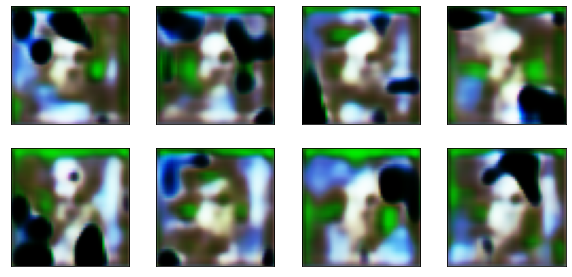

[Step 1200] D Loss: 0.2019; G Loss: 4.8130


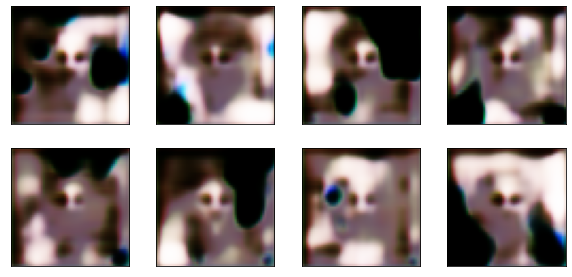

[Step 1300] D Loss: 0.1788; G Loss: 3.1771


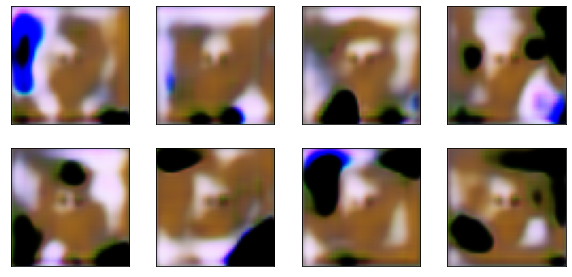

[Step 1400] D Loss: 0.5593; G Loss: 5.5871


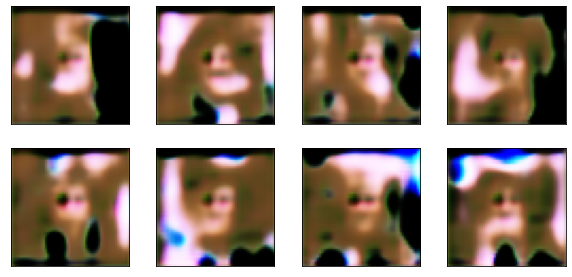

[Step 1500] D Loss: 0.2635; G Loss: 4.4534


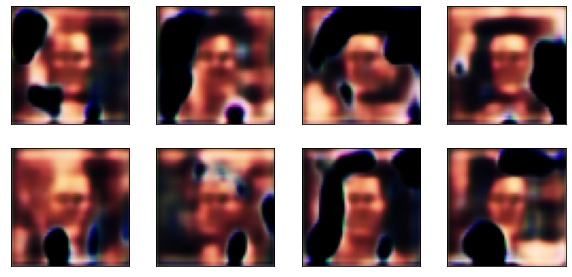

[Step 1600] D Loss: 0.2202; G Loss: 3.1391


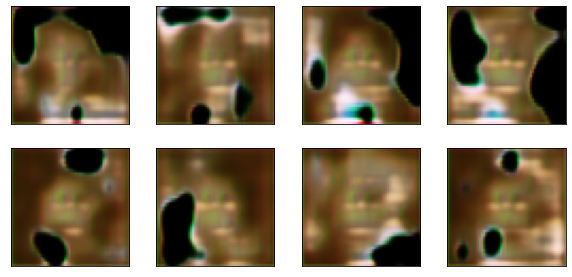

[Step 1700] D Loss: 1.1309; G Loss: 0.8282


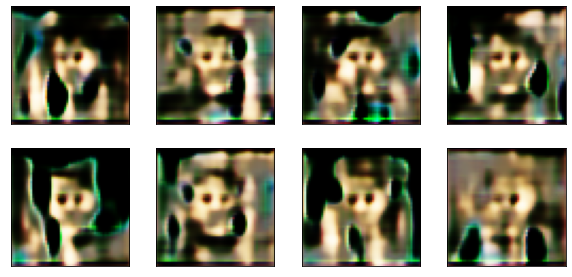

[Step 1800] D Loss: 0.0950; G Loss: 6.0785


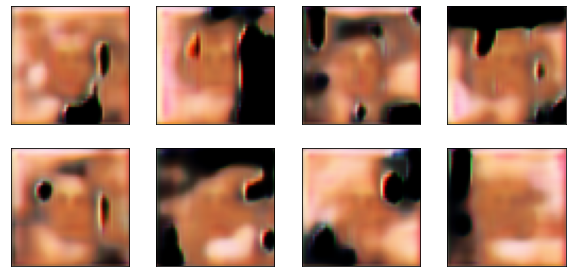

[Step 1900] D Loss: 0.5010; G Loss: 2.6789


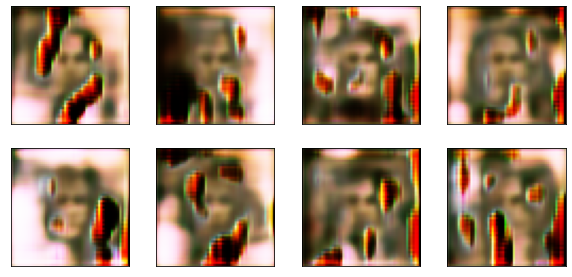

[Step 2000] D Loss: 0.1902; G Loss: 5.2702


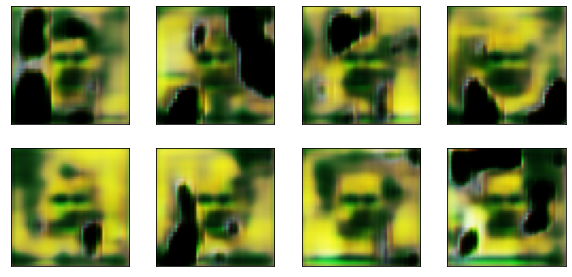

[Step 2100] D Loss: 0.0658; G Loss: 2.8043


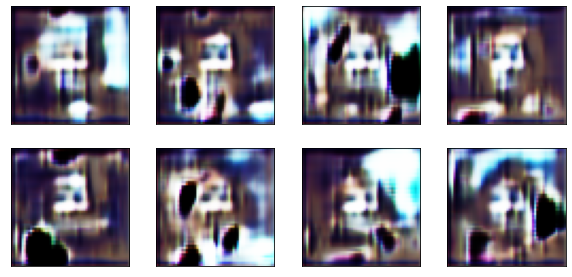

[Step 2200] D Loss: 0.1028; G Loss: 4.8251


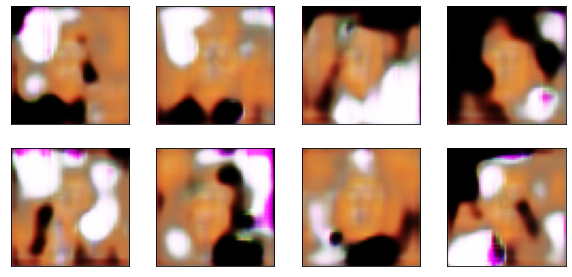

[Step 2300] D Loss: 0.1281; G Loss: 4.4467


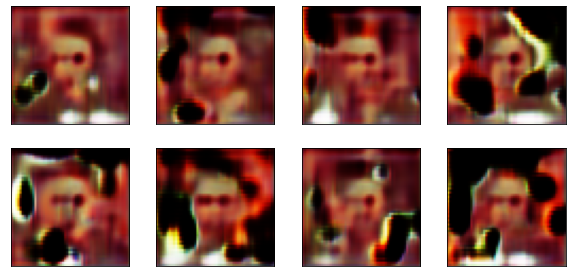

[Step 2400] D Loss: 0.2586; G Loss: 1.2245


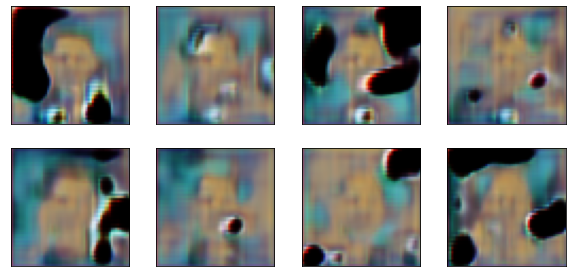

[Step 2500] D Loss: 0.2615; G Loss: 3.4824


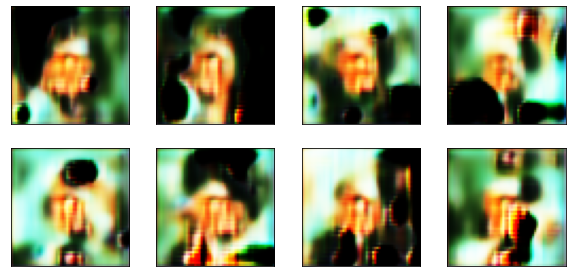

[Step 2600] D Loss: 0.2740; G Loss: 0.0999


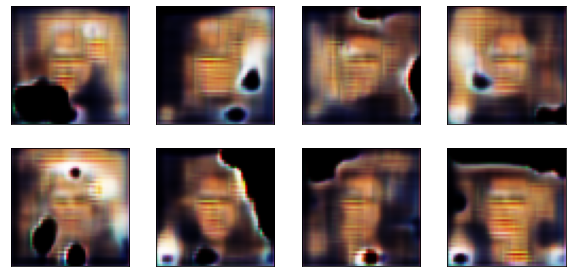

[Step 2700] D Loss: 0.4213; G Loss: 3.2333


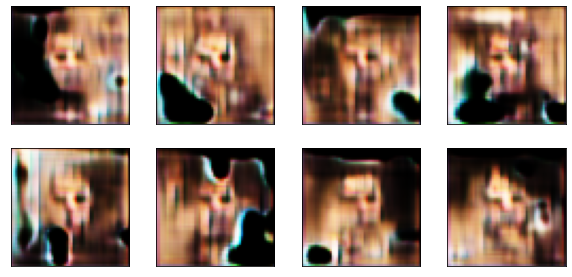

[Step 2800] D Loss: 0.2417; G Loss: 2.5246


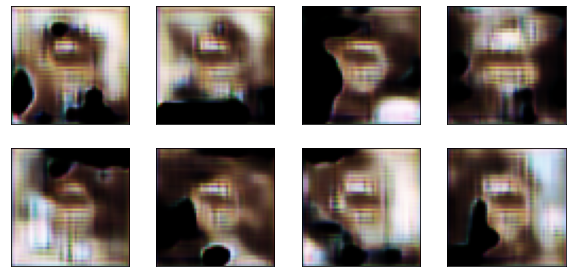

[Step 2900] D Loss: 0.1496; G Loss: 2.8650


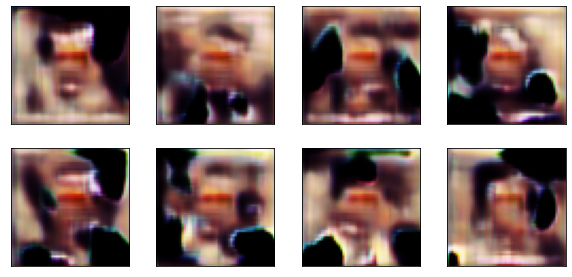

[Step 3000] D Loss: 0.3702; G Loss: 3.8569


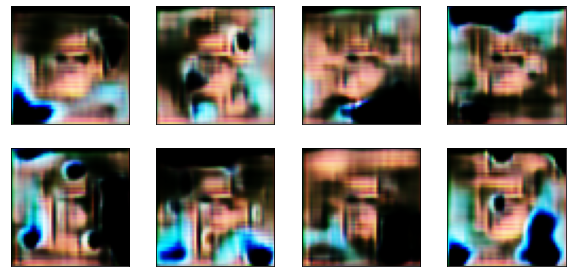

[Step 3100] D Loss: 0.4978; G Loss: 1.8934


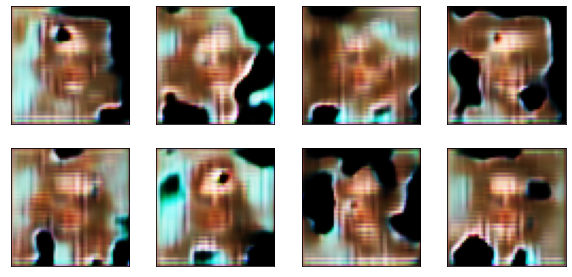

[Step 3200] D Loss: 0.0773; G Loss: 3.5932


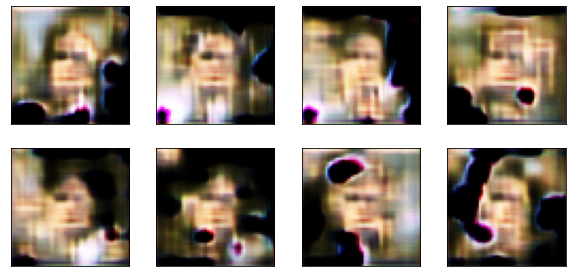

[Step 3300] D Loss: 0.1756; G Loss: 3.4505


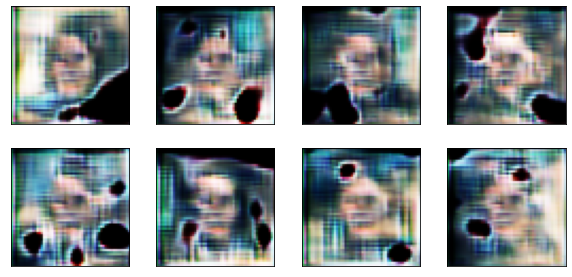

[Step 3400] D Loss: 0.1498; G Loss: 4.5181


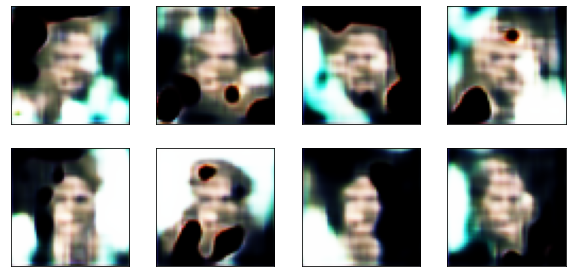

[Step 3500] D Loss: 0.1098; G Loss: 5.6228


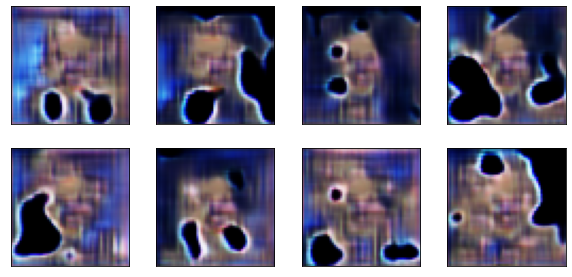

[Step 3600] D Loss: 0.1970; G Loss: 4.0610


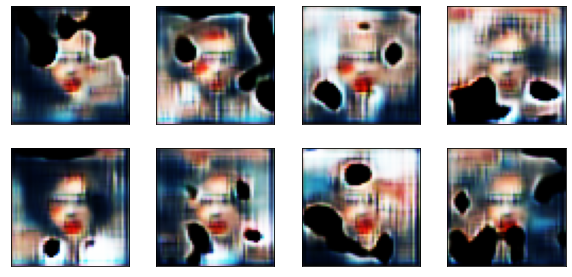

[Step 3700] D Loss: 0.3529; G Loss: 2.4638


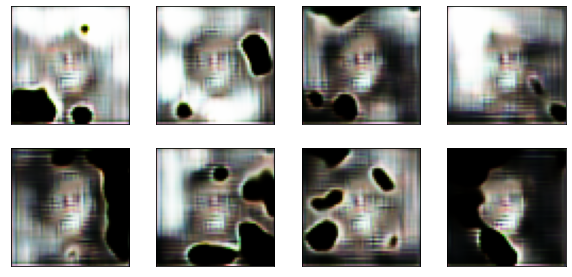

[Step 3800] D Loss: 0.0855; G Loss: 4.3681


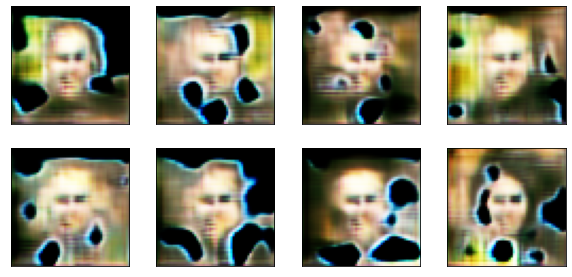

[Step 3900] D Loss: 0.4542; G Loss: 2.5386


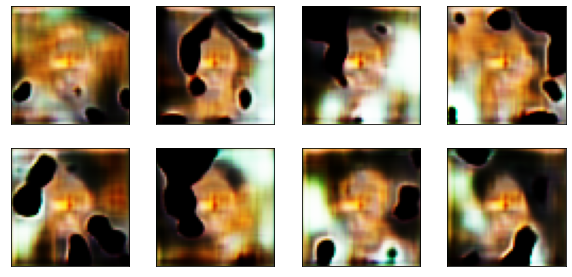

[Step 4000] D Loss: 0.3058; G Loss: 1.5578


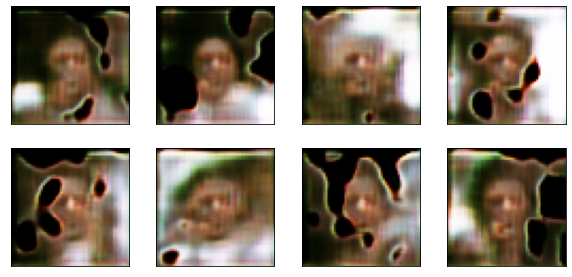

[Step 4100] D Loss: 0.2337; G Loss: 1.9140


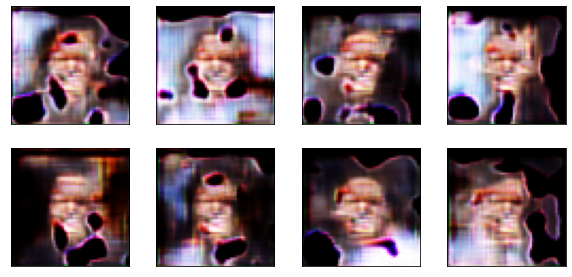

[Step 4200] D Loss: 0.0668; G Loss: 5.3958


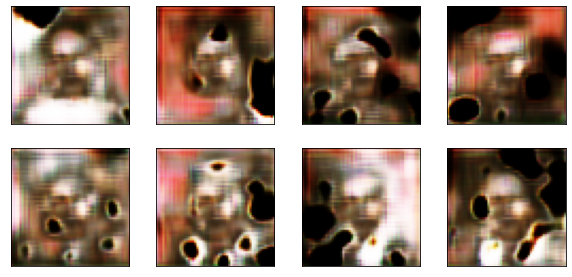

[Step 4300] D Loss: 0.1802; G Loss: 4.7891


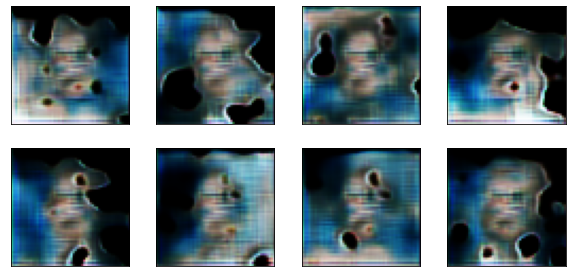

[Step 4400] D Loss: 0.4859; G Loss: 2.1630


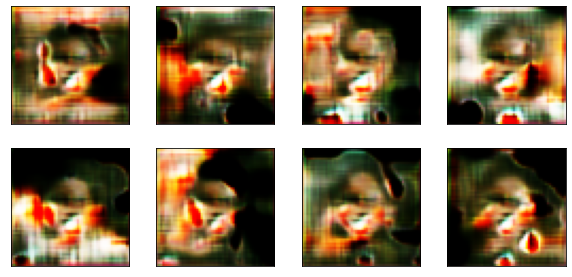

[Step 4500] D Loss: 0.2090; G Loss: 5.2725


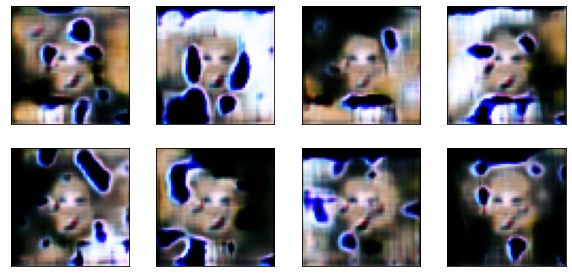

[Step 4600] D Loss: 0.4720; G Loss: 1.3972


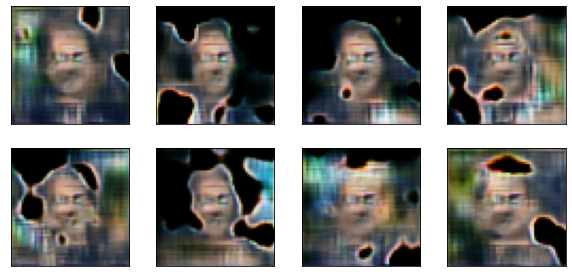

[Step 4700] D Loss: 0.1410; G Loss: 3.9940


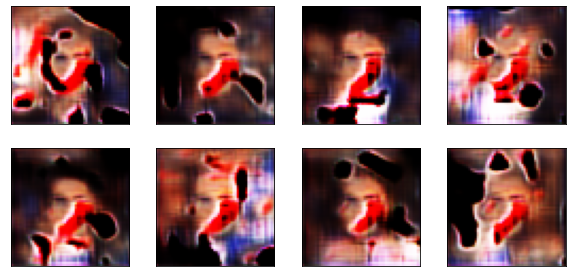

[Step 4800] D Loss: 0.4960; G Loss: 2.8107


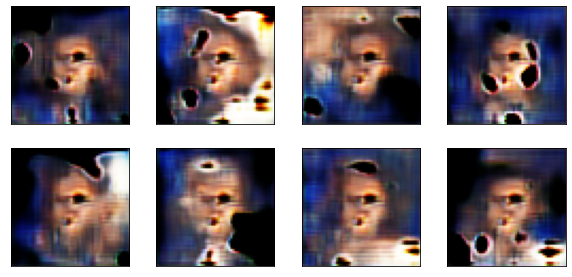

[Step 4900] D Loss: 0.0948; G Loss: 2.0507


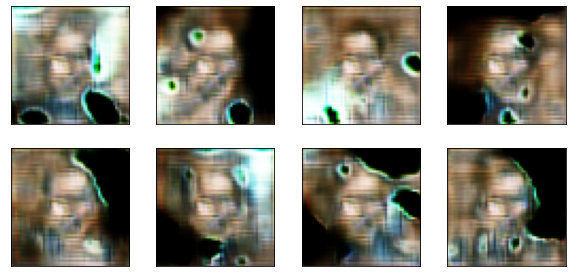

[Step 5000] D Loss: 0.4252; G Loss: 1.0108


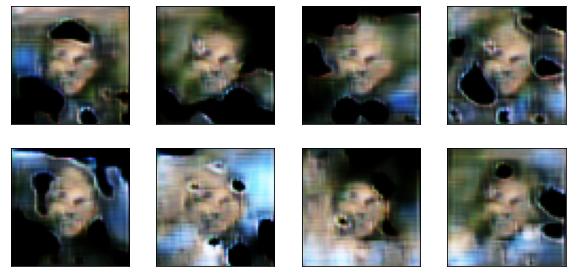

[Step 5100] D Loss: 0.1386; G Loss: 3.5994


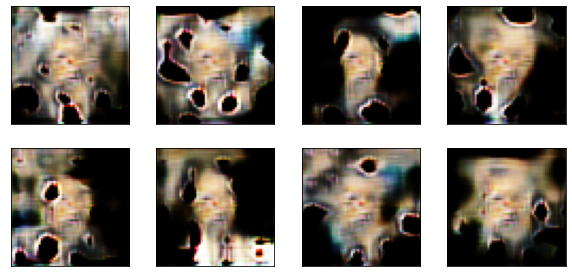

[Step 5200] D Loss: 0.2498; G Loss: 3.2309


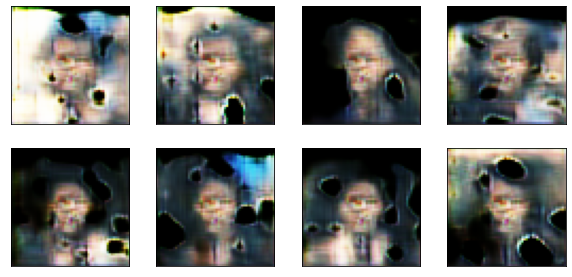

[Step 5300] D Loss: 0.0155; G Loss: 6.1028


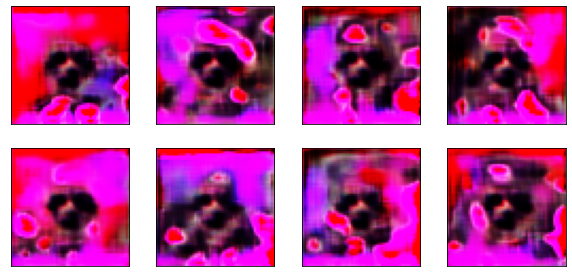

[Step 5400] D Loss: 0.0626; G Loss: 4.4729


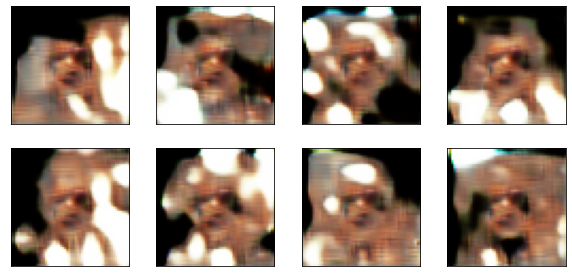

[Step 5500] D Loss: 0.2687; G Loss: 3.2542


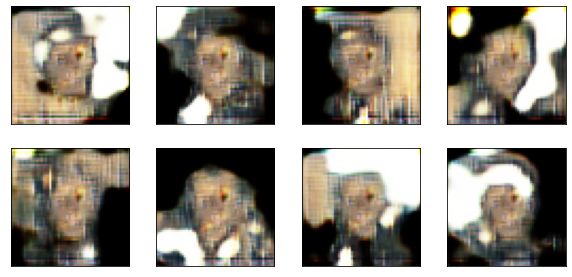

[Step 5600] D Loss: 0.0082; G Loss: 6.9369


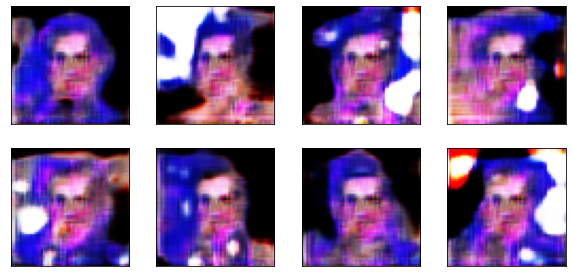

[Step 5700] D Loss: 0.7497; G Loss: 7.0610


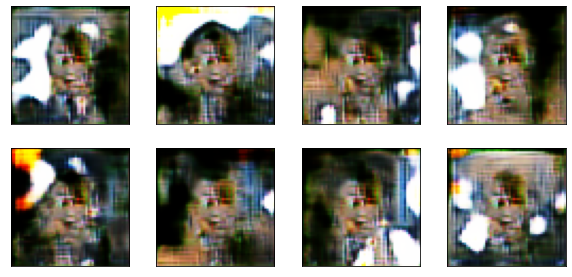

[Step 5800] D Loss: 0.2143; G Loss: 6.3793


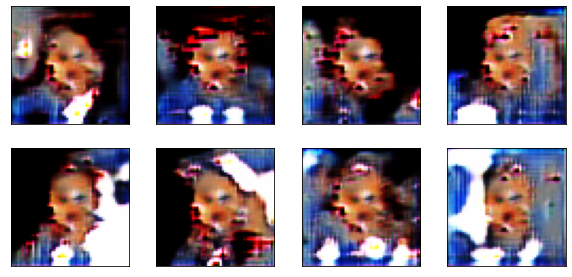

[Step 5900] D Loss: 0.3571; G Loss: 3.1048


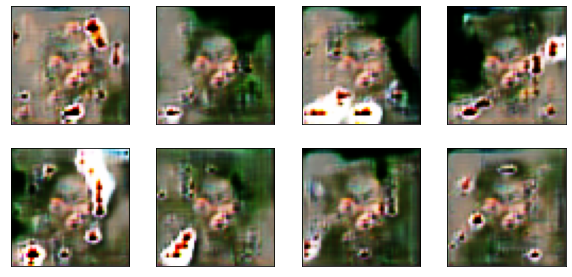

[Step 6000] D Loss: 0.4273; G Loss: 2.3658


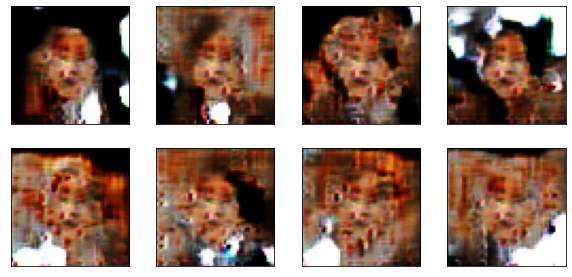

[Step 6100] D Loss: 0.0060; G Loss: 5.1284


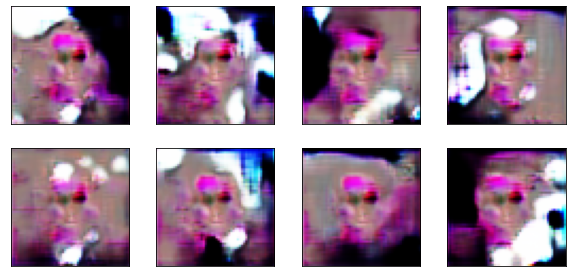

[Step 6200] D Loss: 0.2086; G Loss: 2.4249


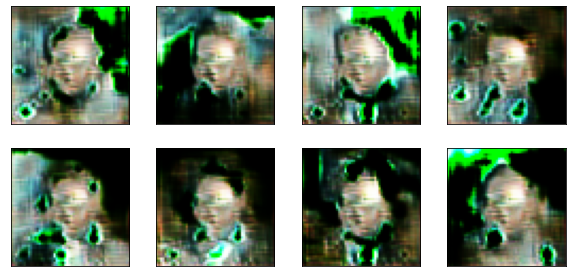

[Step 6300] D Loss: 0.1597; G Loss: 2.7669


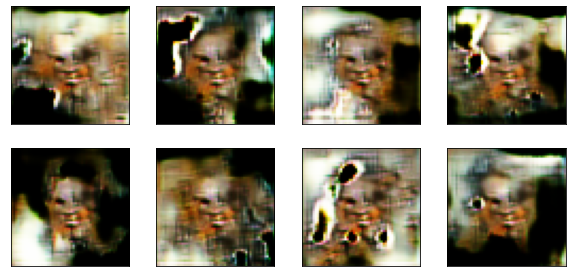

[Step 6400] D Loss: 0.5755; G Loss: 1.4838


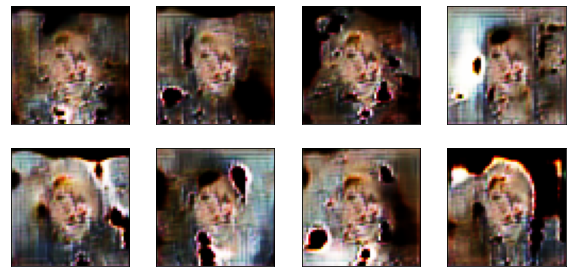

[Step 6500] D Loss: 0.3931; G Loss: 4.4292


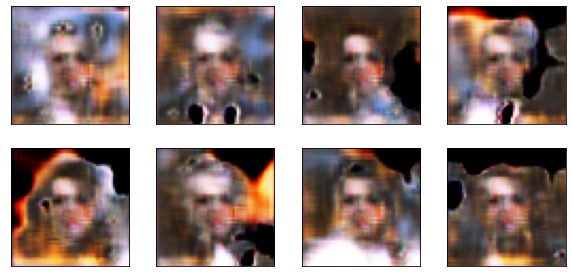

[Step 6600] D Loss: 0.1245; G Loss: 3.2763


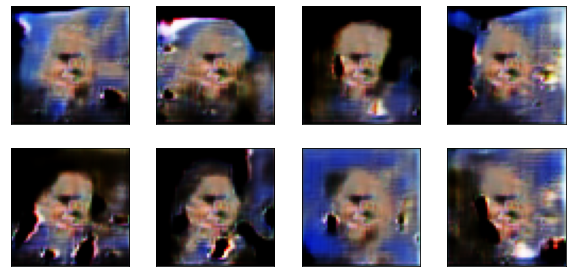

[Step 6700] D Loss: 0.4267; G Loss: 2.3870


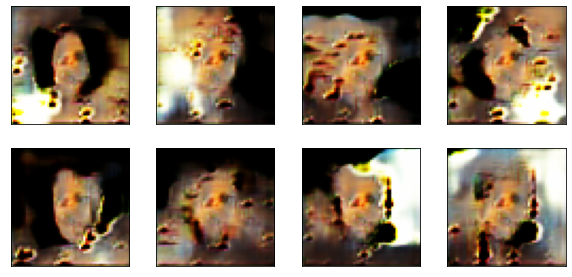

[Step 6800] D Loss: 0.2017; G Loss: 4.5034


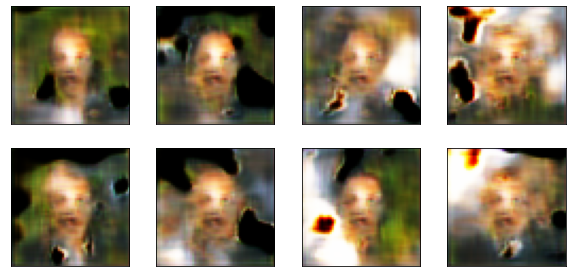

[Step 6900] D Loss: 0.3951; G Loss: 2.2819


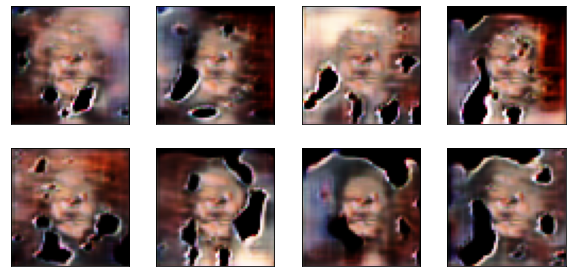

[Step 7000] D Loss: 0.0574; G Loss: 6.8984


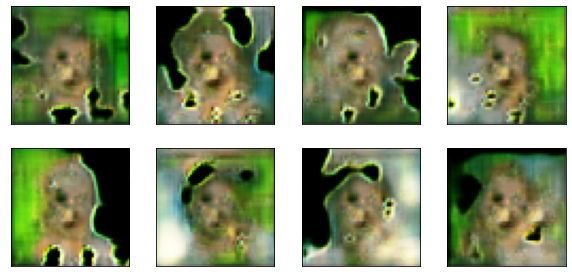

[Step 7100] D Loss: 0.7181; G Loss: 0.7669


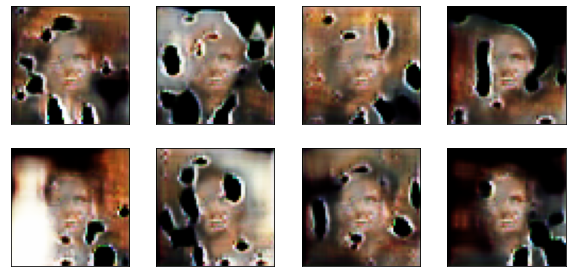

[Step 7200] D Loss: 0.1399; G Loss: 2.8980


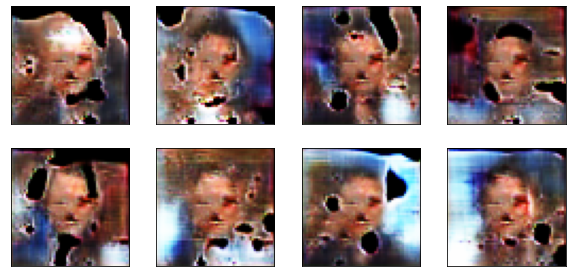

[Step 7300] D Loss: 0.4104; G Loss: 2.3025


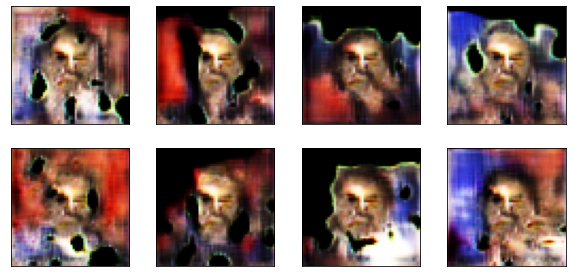

[Step 7400] D Loss: 0.3095; G Loss: 2.3417


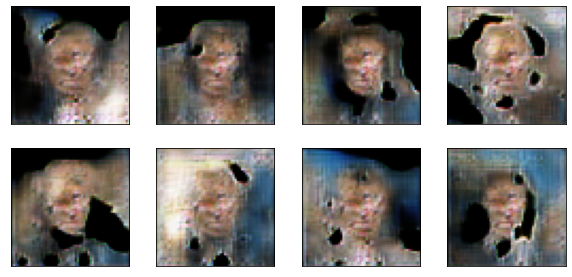

[Step 7500] D Loss: 0.1223; G Loss: 3.5600


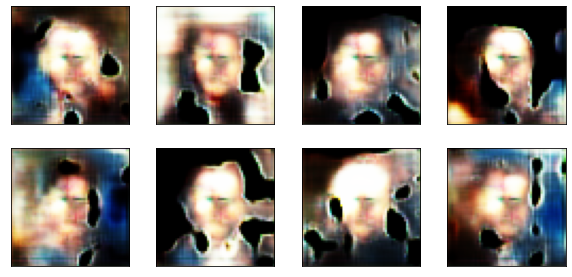

[Step 7600] D Loss: 0.3832; G Loss: 2.1041


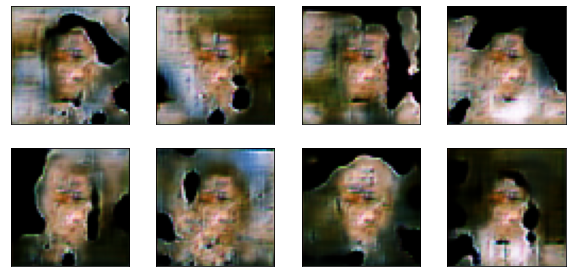

[Step 7700] D Loss: 0.4232; G Loss: 3.1482


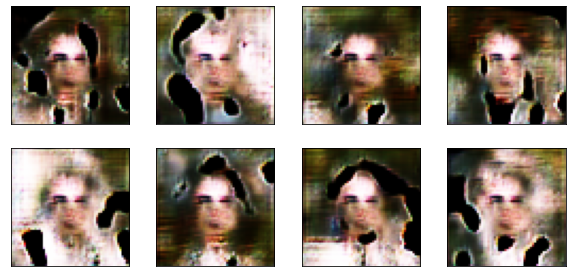

[Step 7800] D Loss: 0.4146; G Loss: 2.3077


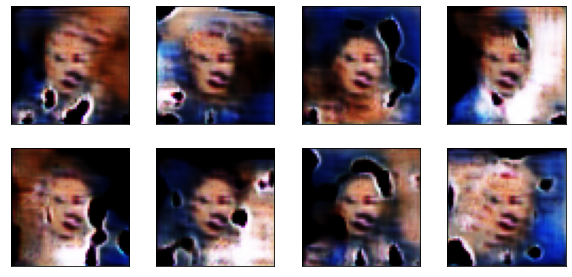

[Step 7900] D Loss: 0.3927; G Loss: 2.0962


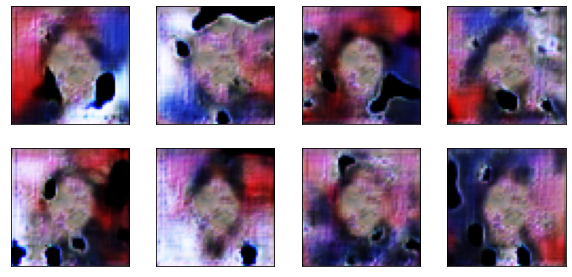

[Step 8000] D Loss: 0.2193; G Loss: 3.7226


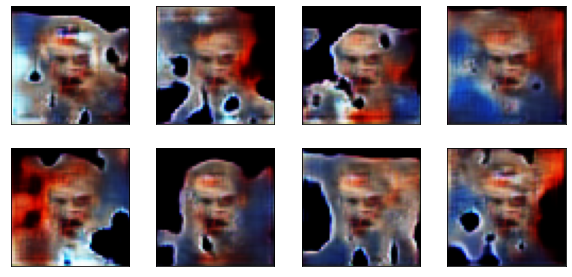

[Step 8100] D Loss: 0.4716; G Loss: 1.8654


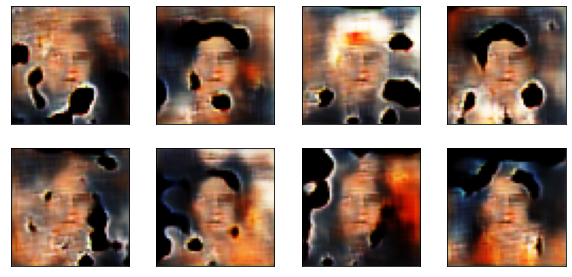

[Step 8200] D Loss: 0.4997; G Loss: 2.6825


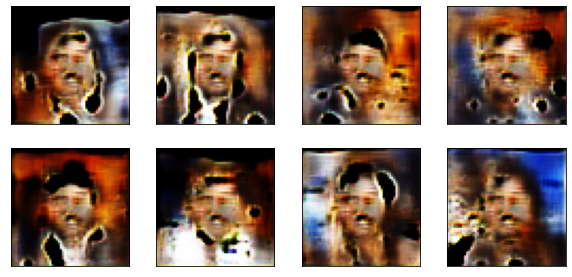

In [35]:
for step, true_images in enumerate(train_ds):
    
    # Обучаем дискриминатор
    
    noise = np.random.normal(0, 1, (HALF_BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    syntetic_images = generator.predict(noise)
    x_combined = np.concatenate((true_images, syntetic_images))
    y_combined = np.concatenate((np.ones((HALF_BATCH_SIZE, 1), np.float32), np.zeros((HALF_BATCH_SIZE, 1), np.float32)))
    
    with tf.GradientTape() as tape:
        logits = discriminator(x_combined, training=True)
        d_loss_value = sigmoid_cross_entropy(y_combined, logits)
    grads = tape.gradient(d_loss_value, discriminator.trainable_variables)
    optimizer.apply_gradients(zip(grads, discriminator.trainable_variables))
    
    # Обучаем генератор
    
    noise = np.random.normal(0, 1, (BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    y_mislabled = np.ones((BATCH_SIZE, 1), np.float32)
    
    with tf.GradientTape() as tape:
        syntetic = generator(noise, training=True)
        logits = discriminator(syntetic, training=False)
        g_loss_value = sigmoid_cross_entropy(y_mislabled, logits)
    grads = tape.gradient(g_loss_value, generator.trainable_variables)
    optimizer.apply_gradients(zip(grads, generator.trainable_variables))
    
    # Проверяем результаты генерации
    
    if step % 100 == 0:
        print('[Step %2d] D Loss: %.4f; G Loss: %.4f' % (
            step, d_loss_value.numpy(), g_loss_value.numpy()))
        noise = np.random.normal(0, 1, (8, INPUT_DIM)).astype(np.float32)
        syntetic_images = generator.predict(noise)
        plot_syntetic(syntetic_images)

## Тестирование GAN

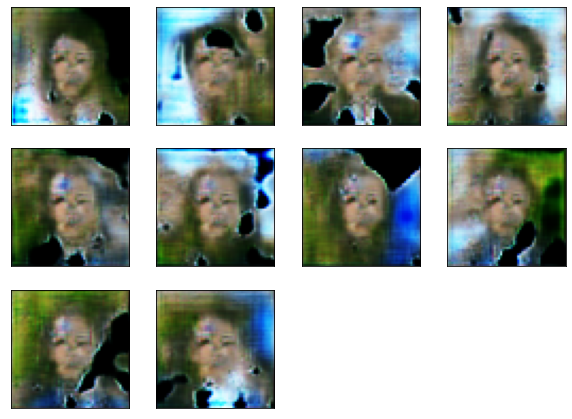

In [40]:
noise = np.random.normal(0, 1, (10, INPUT_DIM)).astype(np.float32)
syntetic_images = generator.predict(noise)
plot_syntetic(syntetic_images)